# Immoweb data analysis 

In [54]:
import pandas as pd
import os
import numpy as np 
from datetime import datetime
import re
import shutil # Import shutil module for file operations
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import matplotlib.pyplot as plt


### Importing row data from csv and creating clean data using Pandas

In [7]:
# Define the path to the raw dataset
raw_data_path = 'data/raw/row_immoweb_data0403.csv'  

# Define the path to the clean dataset folder
clean_data_folder = 'data/cleaned/'

# Ensure the cleaned data folder exists
if not os.path.exists(clean_data_folder):
    os.makedirs(clean_data_folder)

# Current timestamp
timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")

# Full path to the new file with timestamp
clean_data_path = os.path.join(clean_data_folder, f'row_data_20240304_cleaned_{timestamp}.csv')

# Define the final clean data file path
final_clean_data = 'final_clean/row_data_20240304_clean.csv'

# Define the function for loading the dataset
def load_dataset(file_path):
    # Load dataset into DataFrame
    df = pd.read_csv(file_path, encoding='latin-1')  
    return df

### Cleaning up all the data

In [8]:
def clean_dataset(df):
    # Replace empty strings and strings that only contain whitespace with NaN for all columns
    df.replace(r'^\s*$', np.nan, regex=True, inplace=True)

    # Correct the column name if there is a semicolon or unexpected character
    df.columns = df.columns.str.replace(r'[;]+$', '', regex=True)

    # Calculate the number of duplicate rows before dropping them
    duplicate_rows = df.duplicated().sum()

    # Remove duplicate rows
    df = df.drop_duplicates()

    # Drop rows with any missing values in specific columns (if these columns must not have missing values)
    cols_with_missing_values = ['id', 'locality', 'postalcode', 'price_main']
    df = df.dropna(subset=cols_with_missing_values)

    # Debugging: Check data types before conversion
    print("Data types before conversion:\n", df.dtypes)

    # Convert all columns with float type that have whole numbers to Int64
    for col in df.select_dtypes(include=['float']).columns:
        # Create a mask for all non-NaN entries that have only one digit after the decimal point, which is '0'
        mask = df[col].notna() & (df[col] % 1 == 0)
        # Apply the mask and convert to Int64
        df.loc[mask, col] = df.loc[mask, col].astype('Int64')

        # Remove '.0' suffix from numbers in all numeric columns
        if df[col].dtype == 'float64':
            df[col] = df[col].apply(lambda x: re.sub(r'\.0$', '', str(x)) if pd.notnull(x) else x)

    # Debugging: Check data types after conversion
    print("Data types after conversion:\n", df.dtypes)

    # Convert boolean columns to 0 and 1
    boolean_columns = [col for col in df.columns if df[col].dtype == bool]
    for col in boolean_columns:
        df[col] = df[col].astype(int)

    # Remove leading and trailing spaces from string columns
    df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

    # Replace empty strings resulted from stripping with NaN for string columns
    string_columns = df.select_dtypes(include=['object']).columns
    df[string_columns] = df[string_columns].replace(r'^\s*$', np.nan, regex=True)

    # Check each column and replace empty values with NaN
    for col in df.columns:
        # If column is numeric, replace non-existent values with NaN
        if df[col].dtype == 'float64' or df[col].dtype == 'int64':
            df[col] = df[col].replace(0, np.nan)
        # If column is not numeric (and hence is categorical), replace empty strings with NaN
        else:
            df[col] = df[col].replace('', np.nan)

    return df, duplicate_rows  # Return the DataFrame and the number of duplicate rows

### Print statements 

In [9]:
# Load the raw dataset
df_raw = load_dataset(raw_data_path)

# Clean the dataset, Unpack the returned DataFrame and duplicate row count
df_cleaned, duplicate_rows = clean_dataset(df_raw)  

# Save the cleaned dataset with a timestamp to create a new file each run
df_cleaned.to_csv(clean_data_path, index=False, na_rep='nan')

# Debugging: Print a sample of the DataFrame after conversion
print("Sample data after conversion:\n", df_cleaned.head())

# Output the path to confirm where the cleaned CSV has been saved
print(f"Cleaned data saved to: {clean_data_path}")

# Print a summary of NaN counts per column right after cleaning
print(df_cleaned.isna().sum())

# Print the number of duplicate rows
print(f"Duplicate rows: {duplicate_rows}")

# Copy the latest cleaned dataset to the final clean data file path
shutil.copy(clean_data_path, final_clean_data)


Data types before conversion:
 id                                    int64
region                               object
province                             object
district                             object
locality                             object
postalcode                            int64
latitude                            float64
longitude                           float64
price_main                          float64
type                                 object
subtype                              object
heatingType                          object
cadastralIncome                       int64
epcScores                            object
primaryEnergyConsumption            float64
bedrooms                            float64
surface                             float64
surfaceGood                         float64
hasGasWaterElectricityConnection     object
condition                            object
facadeCount                         float64
hasKitchenSetup                      object
i

C:\Users\daryc\AppData\Local\Temp\ipykernel_23572\3545088950.py:41: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)


Sample data after conversion:
          id    region       province district   locality  postalcode  \
0  10858284  Wallonie     Luxembourg    Arlon    Halanzy        6792   
1  10930768  Flanders        Antwerp  Antwerp  ANTWERPEN        2018   
2  11137665  Flanders  East Flanders     Gent   ERTVELDE        9940   
3  10966577  Flanders        Antwerp  Antwerp   Kapellen        2950   
4  11110694  Flanders        Antwerp  Antwerp     Deurne        2100   

     latitude  longitude price_main       type  ...    condition facadeCount  \
0  49.5826321  5.7562931     220000      HOUSE  ...  TO_RENOVATE           3   
1  51.1945938   4.407379     589500  APARTMENT  ...         GOOD           4   
2  51.1793527  3.7402742     825000      HOUSE  ...          NaN           4   
3  51.3450599  4.4010322     575000      HOUSE  ...         GOOD           4   
4  51.2349941  4.4708698     179000  APARTMENT  ...       AS_NEW           3   

   hasKitchenSetup isFurnished fireplaceExists hasSwimm

'final_clean/row_data_20240304_clean.csv'

### How many observations and features do you have?

In [10]:
# Calculate the number of observations (rows) and features (columns) for houses
num_observations_house = df_cleaned[df_cleaned['type'] == 'HOUSE'].shape[0]
num_features_house = df_cleaned[df_cleaned['type'] == 'HOUSE'].shape[1]

# Calculate the number of observations (rows) and features (columns) for apartments
num_observations_apartment = df_cleaned[df_cleaned['type'] == 'APARTMENT'].shape[0]
num_features_apartment = df_cleaned[df_cleaned['type'] == 'APARTMENT'].shape[1]

# Calculate the total number of observations (rows) and features (columns)
num_observations_total = df_cleaned.shape[0]
num_features_total = df_cleaned.shape[1]

# Calculate the percentages
percent_house = (num_observations_house / num_observations_total) * 100
percent_apartment = (num_observations_apartment / num_observations_total) * 100

# Print the total number of observations and features
print("\nTotal:")
print(f"Number of observations: {num_observations_total}")
print(f"Number of features: {num_features_total}")

# Print the number of observations and features for houses
print(f"Number of HOUSE observations: {num_observations_house} ({percent_house:.1f}%)")

# Print the number of observations and features for apartments
print(f"Number of APARTMENTS observations: {num_observations_apartment} ({percent_apartment:.1f}%)")




Total:
Number of observations: 74325
Number of features: 29
Number of HOUSE observations: 45239 (60.9%)
Number of APARTMENTS observations: 29086 (39.1%)


### What is the proportion of missing values per column?

In [11]:
# Calculate the proportion of missing values per column
missing_proportion = df_cleaned.isna().mean() * 100

# Create a DataFrame to hold the missing proportion information
missing_info_df = pd.DataFrame({
    'Total Missing': missing_proportion.round(1),
    'Missing for HOUSE': df_cleaned[df_cleaned['type'] == 'HOUSE'].isna().mean().round(1) * 100,
    'Missing for APARTMENT': df_cleaned[df_cleaned['type'] == 'APARTMENT'].isna().mean().round(1) * 100
})

# Convert the DataFrame to a string without wrapping
missing_info_str = missing_info_df.to_string(line_width=1000)

# Print the missing proportion information
print("Missing Proportion Information (rounded to 1 decimal place):")
print(missing_info_str)


Missing Proportion Information (rounded to 1 decimal place):
                                  Total Missing  Missing for HOUSE  Missing for APARTMENT
id                                          0.0                0.0                    0.0
region                                      0.0                0.0                    0.0
province                                    0.0                0.0                    0.0
district                                    0.0                0.0                    0.0
locality                                    0.0                0.0                    0.0
postalcode                                  0.0                0.0                    0.0
latitude                                   19.0               20.0                   20.0
longitude                                  19.0               20.0                   20.0
price_main                                  0.0                0.0                    0.0
type                                   

### Which variables would you delete and why?

Variable that is 100% missing for an Apartment or House like isNewRealEstateProject or hasGasWaterElectricityConnection for Apartments 

### What variables are most subject to outliers?

In [83]:
def plot_variable(df, column):
    # Sort values from small to big
    df_sorted = df.sort_values(by=column)
    
    # Apply filters for specific columns
    if column == 'price_main':
        df_sorted = df_sorted[df_sorted[column] <= 500000]  # Limit price_main to max 500k
    elif column == 'surface':
        df_sorted = df_sorted[df_sorted[column] <= 300]  # Limit surface to max 300m²
    elif column == 'cadastralIncome':
        df_sorted = df_sorted[df_sorted[column] <= 2000]  # Limit cadastralIncome to max 2000
    
    # Create the Plotly figure
    fig = px.histogram(df_sorted, x=column, color='type', title=f'{column} Distribution', 
                       labels={'type': 'Property Type', column: 'Value'},
                       barmode='group',
                       color_discrete_map={'HOUSE': 'DodgerBlue', 'APARTMENT': 'LimeGreen'})
    
    # Display the plot in the notebook
    fig.show()

# Define the columns you want to plot
columns_to_plot = ['region', 'province', 'price_main', 'surface', 'cadastralIncome', 'epcScores', 'hasSwimmingPool']

# Loop through each column and plot its distribution
for column in columns_to_plot:
    plot_variable(df_cleaned, column)


### How many qualitative and quantitative variables are there? How would you transform the qualitative values into numerical values?

In [21]:
# Load the final clean dataset
final_clean_data = 'final_clean/row_data_20240304_clean.csv'
df_cleaned = pd.read_csv(final_clean_data)

# Get the data types of each column
data_types = df_cleaned.dtypes

# Count the number of qualitative and quantitative variables
num_categorical = sum(data_types == 'object')
num_numeric = sum(data_types != 'object')

print("Number of qualitative variables:", num_categorical)
print("Number of quantitative variables:", num_numeric)


Number of qualitative variables: 14
Number of quantitative variables: 15


### What is the correlation between the variables and the price? Why do you think some variables are more correlated than others?

In [82]:
# Filter the DataFrame into houses and apartments
houses_df = df_cleaned[df_cleaned['type'] == 'HOUSE']
apartments_df = df_cleaned[df_cleaned['type'] == 'APARTMENT']

# Select only numeric columns for correlation analysis
numeric_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

# Function to calculate correlation and plot
def plot_correlation(data, property_type):
    # Calculate the correlation matrix
    correlation_matrix = data[numeric_columns].corr()
    
    # Extract the correlation of each variable with the price
    price_correlation = correlation_matrix['price_main'].drop('price_main')
    
    # Sort the correlations in descending order
    sorted_correlation = price_correlation.abs().sort_values(ascending=False)
    
    # Plot the bar chart
    fig = go.Figure(go.Bar(
        x=sorted_correlation.index,
        y=sorted_correlation.values,
        marker_color='DodgerBlue' if property_type == 'Houses' else 'LimeGreen'
    ))

    fig.update_layout(
        title=f"Correlation between variables and the price for {property_type}",
        xaxis_title="Variables",
        yaxis_title="Correlation with Price"
    )
    
    # Show the plot in the notebook
    fig.show()

# Plot correlation for houses
plot_correlation(houses_df, 'Houses')

# Plot correlation for apartments
plot_correlation(apartments_df, 'Apartments')


**Conclusion Price/variables correlation:**
For apartments is bedroom and terrace surface important. Latitude/Longitude shown that location is also important. 
For houses is surface, bedrooms, garden, terrace more important. 

### How are the variables themselves correlated to each other? Can you find groups of variables that are correlated together?

In [27]:
# Filter the DataFrame into houses and apartments
houses_df = df_cleaned[df_cleaned['type'] == 'HOUSE']
apartments_df = df_cleaned[df_cleaned['type'] == 'APARTMENT']

# Exclude 'id' and 'price_main' columns
numeric_columns_houses = houses_df.select_dtypes(include=['float64', 'int64']).drop(columns=['id', 'price_main'])
numeric_columns_apartments = apartments_df.select_dtypes(include=['float64', 'int64']).drop(columns=['id', 'price_main'])

# Calculate the correlation matrix for houses
correlation_matrix_houses = numeric_columns_houses.corr()

# Calculate the correlation matrix for apartments
correlation_matrix_apartments = numeric_columns_apartments.corr()

# Define function to plot correlation matrix
def plot_correlation_matrix(correlation_matrix, title):
    fig = go.Figure(data=go.Heatmap(
        z=correlation_matrix.values,
        x=correlation_matrix.columns,
        y=correlation_matrix.index,
        colorscale='Viridis'))

    fig.update_layout(
        title=title,
        xaxis_title="Features",
        yaxis_title="Features"
    )

    fig.show()

# Plot correlation matrix for houses
plot_correlation_matrix(correlation_matrix_houses, "Correlation Matrix for Houses")

# Plot correlation matrix for apartments
plot_correlation_matrix(correlation_matrix_apartments, "Correlation Matrix for Apartments")


### How are the number of properties distributed according to their surface?

In [81]:
import numpy as np
import plotly.graph_objects as go

# Define function to plot and save histogram
def plot_and_save_histogram(data, title, filename, surface_filter=None):
    fig = go.Figure()

    if surface_filter:
        data = data[data <= surface_filter]

    fig.add_trace(go.Histogram(
        x=data,
        marker_color='DodgerBlue' if 'houses' in title.lower() else 'LimeGreen',  # Color based on property type
        opacity=0.75
    ))

    mean_value = np.mean(data)
    median_value = np.median(data)

    fig.update_layout(
        title=title,
        xaxis_title="Surface",
        yaxis_title="Number of Properties"
    )

    # Add mean and median annotations
    fig.add_annotation(x=mean_value, y=0, text=f'Mean: {mean_value:.2f}', showarrow=True, arrowhead=1, ax=0, ay=-40)
    fig.add_annotation(x=median_value, y=0, text=f'Median: {median_value}', showarrow=True, arrowhead=1, ax=0, ay=-60)

    fig.show()  # Display the histogram in the notebook

# Plot histogram for houses with a surface filter of 1000
plot_and_save_histogram(houses_df['surface'], "Distribution of properties according to surface (Houses)",
                         "surface_distribution_houses.html", surface_filter=1000)

# Plot histogram for apartments with a surface filter of 500
plot_and_save_histogram(apartments_df['surface'], "Distribution of properties according to surface (Apartments)",
                         "surface_distribution_apartments.html", surface_filter=500)


### Which five variables do you consider the most important and why?

Look at correlation_price_apartments (bedrooms, terracesurface) and correlation_price_houses (surface, bedrooms, gardensurface, terracesurface, latitude)

### What are the least/most expensive municipalities in Belgium/Wallonia/Flanders? (in terms of price per m², average price, and median price)

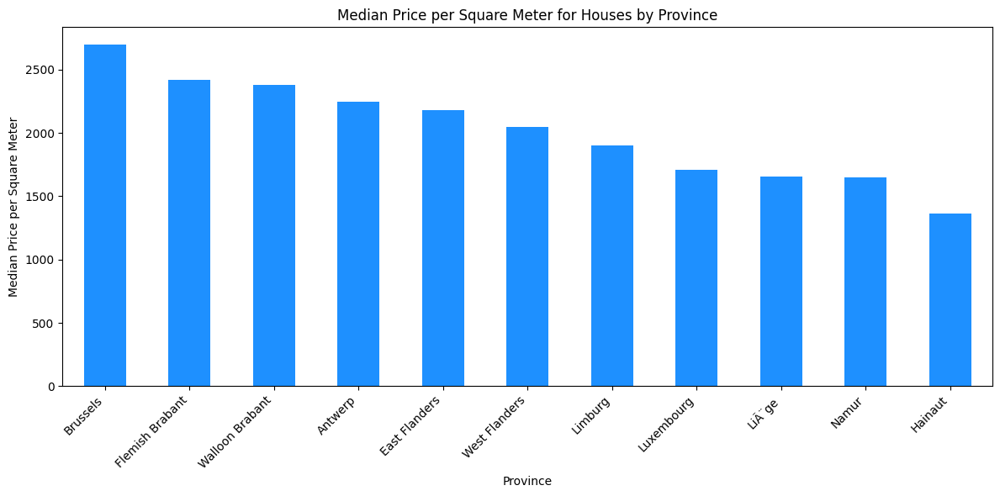

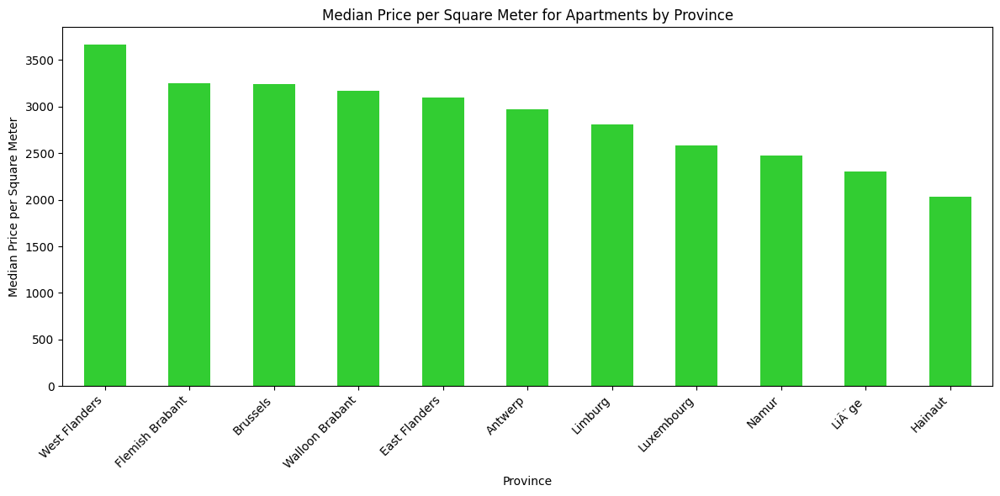

In [80]:
# Load the final clean dataset
final_clean_data = 'final_clean/row_data_20240304_clean.csv'
df_cleaned = pd.read_csv(final_clean_data)

# Filter the DataFrame into houses and apartments
houses_df = df_cleaned[df_cleaned['type'] == 'HOUSE']
apartments_df = df_cleaned[df_cleaned['type'] == 'APARTMENT']

# Group by province and calculate the median price per square meter for houses
houses_price_per_sqm_by_province = houses_df.groupby('province').agg({'price_main': 'median', 'surface': 'median'})
houses_price_per_sqm_by_province['price_per_sqm'] = houses_price_per_sqm_by_province['price_main'] / houses_price_per_sqm_by_province['surface']
houses_price_per_sqm_by_province = houses_price_per_sqm_by_province['price_per_sqm'].sort_values(ascending=False)

# Group by province and calculate the median price per square meter for apartments
apartments_price_per_sqm_by_province = apartments_df.groupby('province').agg({'price_main': 'median', 'surface': 'median'})
apartments_price_per_sqm_by_province['price_per_sqm'] = apartments_price_per_sqm_by_province['price_main'] / apartments_price_per_sqm_by_province['surface']
apartments_price_per_sqm_by_province = apartments_price_per_sqm_by_province['price_per_sqm'].sort_values(ascending=False)

# Plot histogram for houses
plt.figure(figsize=(12, 6))
houses_price_per_sqm_by_province.plot(kind='bar', color='DodgerBlue')
plt.title('Median Price per Square Meter for Houses by Province')
plt.xlabel('Province')
plt.ylabel('Median Price per Square Meter')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('house_price_per_sqm_by_province.png')
plt.show()

# Plot histogram for apartments
plt.figure(figsize=(12, 6))
apartments_price_per_sqm_by_province.plot(kind='bar', color='LimeGreen')
plt.title('Median Price per Square Meter for Apartments by Province')
plt.xlabel('Province')
plt.ylabel('Median Price per Square Meter')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('apartment_price_per_sqm_by_province.png')
plt.show()


### Distribution of Average Price per Square Meter for Houses and Apartments

In [78]:
import plotly.graph_objects as go
import plotly.io as pio

def plot_and_save_histogram(data, title, filename, surface_filter=None, color='skyblue'):
    if surface_filter:
        filtered_data = data[data <= surface_filter]
        filtered_title = f"{title} (Surface <= {surface_filter})"
    else:
        filtered_data = data
        filtered_title = title
    
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=filtered_data, name='Data', marker_color=color))
    fig.update_layout(title=filtered_title,
                      xaxis_title='Value', yaxis_title='Frequency')

    # Calculate mean and median
    mean_value = filtered_data.mean()
    median_value = filtered_data.median()

    # Add mean and median annotations
    fig.add_annotation(x=mean_value, y=0, text=f'Mean: {mean_value:.2f}', showarrow=True, arrowhead=1, ax=0, ay=-40)
    fig.add_annotation(x=median_value, y=0, text=f'Median: {median_value}', showarrow=True, arrowhead=1, ax=0, ay=-60)

    # Display the histogram in the notebook
    fig.show()

# Plot histogram for houses with a surface filter of 1000
plot_and_save_histogram(houses_df['surface'], "Distribution of properties according to surface (Houses)",
                         "surface_distribution_houses.html", surface_filter=1000, color='DodgerBlue')

# Plot histogram for apartments with a surface filter of 500
plot_and_save_histogram(apartments_df['surface'], "Distribution of properties according to surface (Apartments)",
                         "surface_distribution_apartments.html", surface_filter=500, color='LimeGreen')


In [79]:
# Load the final clean dataset with specified encoding
final_clean_data = 'final_clean/row_data_20240304_clean.csv'
df_cleaned = pd.read_csv(final_clean_data, encoding='latin1')

# Filter the DataFrame for houses and apartments
houses_df = df_cleaned[(df_cleaned['type'] == 'HOUSE') & (df_cleaned['surface'] >= 20)].copy()
apartments_df = df_cleaned[(df_cleaned['type'] == 'APARTMENT') & (df_cleaned['surface'] >= 10)].copy()

# Calculate price per square meter for houses and apartments
houses_df['price_per_sqm'] = houses_df['price_main'] / houses_df['surface']
apartments_df['price_per_sqm'] = apartments_df['price_main'] / apartments_df['surface']

# Group by size and calculate average price per square meter
avg_price_per_sqm_by_size_houses = houses_df.groupby('surface')['price_per_sqm'].mean().reset_index()
avg_price_per_sqm_by_size_apartments = apartments_df.groupby('surface')['price_per_sqm'].mean().reset_index()

# Limit the x-axis to 300 square meters
avg_price_per_sqm_by_size_houses = avg_price_per_sqm_by_size_houses[avg_price_per_sqm_by_size_houses['surface'] <= 300]
avg_price_per_sqm_by_size_apartments = avg_price_per_sqm_by_size_apartments[avg_price_per_sqm_by_size_apartments['surface'] <= 300]

# Plot the scatter plots for houses and apartments
fig_houses = px.scatter(avg_price_per_sqm_by_size_houses, x='surface', y='price_per_sqm', 
                         title='Average Price per Square Meter for Houses by Size (Up to 300m²)', 
                         labels={'surface': 'Size (m²)', 'price_per_sqm': 'Price per Square Meter'},
                         color_discrete_sequence=['DodgerBlue'])
fig_apartments = px.scatter(avg_price_per_sqm_by_size_apartments, x='surface', y='price_per_sqm', 
                            title='Average Price per Square Meter for Apartments by Size (Up to 300m²)', 
                            labels={'surface': 'Size (m²)', 'price_per_sqm': 'Price per Square Meter'},
                            color_discrete_sequence=['LimeGreen'])

# Display the plots in the notebook
fig_houses.show()
fig_apartments.show()
